In [1]:
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib.patches import Circle

import config
import graph_provider
import dataset
import evaluation
from algorithms.baseline import Baseline
from algorithms.hybrid_matching import HybridMatching
from algorithms.topological_matching import TopologicalMatching
from algorithms.weighted_matching import WeightedMatching

In [2]:
ROUTE_INDEX = 7  # Change this to visualize a different route

In [3]:
graph = graph_provider.get_graph(config.data_dir)
samples = dataset.get_dataset(config.data_dir)[:10]

In [4]:
algorithms_classes = [Baseline, WeightedMatching, TopologicalMatching, HybridMatching]
algorithms = []
for algo_cls in algorithms_classes:
    algorithms.append(algo_cls(graph))

samples = evaluation.evaluate_dataset(algorithms, samples)


Evaluating routes: 100%|██████████| 10/10 [00:01<00:00,  7.23it/s]


In [5]:
route = samples[ROUTE_INDEX]
noisy_lons = [s['noisy']['longitude'] for s in route]
noisy_lats = [s['noisy']['latitude'] for s in route]
actual_lons = [s['actual']['longitude'] for s in route]
actual_lats = [s['actual']['latitude'] for s in route]
accuracies = [s['actual']['accuracy'] for s in route]
algo_names = [algo_cls.get_name() for algo_cls in algorithms]
pred_lons = {name: [s['predictions'][name]['longitude'] for s in route] for name in algo_names}
pred_lats = {name: [s['predictions'][name]['latitude'] for s in route] for name in algo_names}

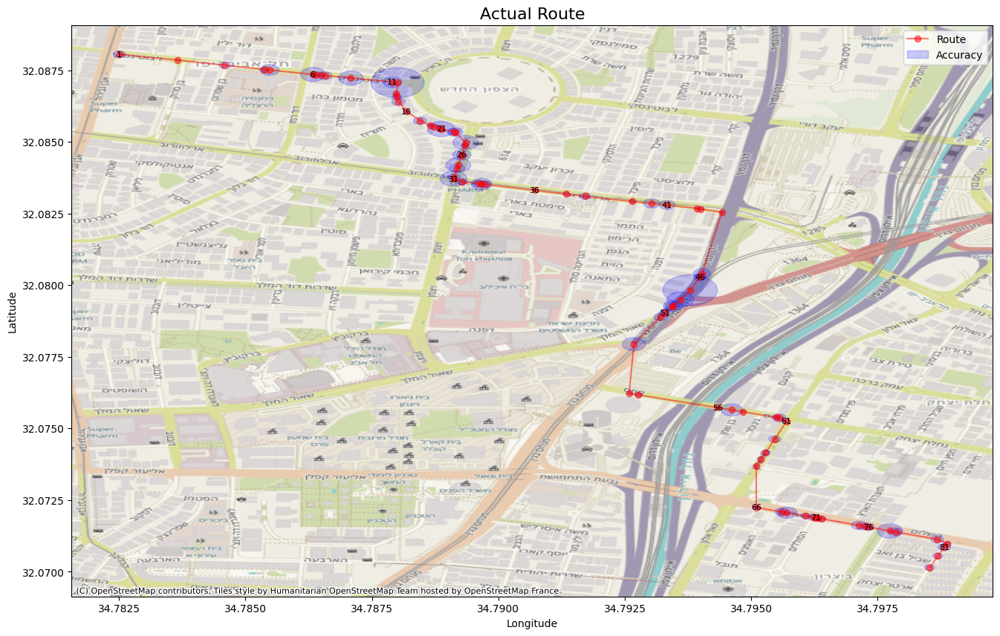

In [6]:
def draw_route(title, longitudes, latitudes, accuracies):
    fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(16, 10))

    # Plot the route line connecting the points
    ax.plot(longitudes, latitudes, 'o-', color='red', label='Route', alpha=0.5)

    # A constant for converting meters to decimal degrees (approximation)
    METERS_PER_DEGREE = 111320

    if not accuracies:
        accuracies = [0] * len(longitudes)

    # Iterate through each point to add circles and labels
    for i, (lon, lat, acc) in enumerate(zip(longitudes, latitudes, accuracies)):
        # Convert accuracy from meters to degrees for the circle's radius
        radius_in_degrees = acc / METERS_PER_DEGREE

        # Create a circle patch for the accuracy
        accuracy_circle = Circle(
            (lon, lat),
            radius_in_degrees,
            color='blue',
            alpha=0.2,
            label='Accuracy' if i == 0 else "" # Only label the first one
        )
        ax.add_patch(accuracy_circle)

        # Add a number next to each point to indicate its order in the route
        if i % 5 == 0:
            ax.text(lon, lat, str(i + 1), color='black', fontsize=8,  ha='center', va='center')

    cx.add_basemap(ax, crs=config.default_crs)

    ax.set_title(title, fontsize=16)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    plt.legend()
    plt.show()

draw_route('Actual Route', actual_lons, actual_lats, accuracies)

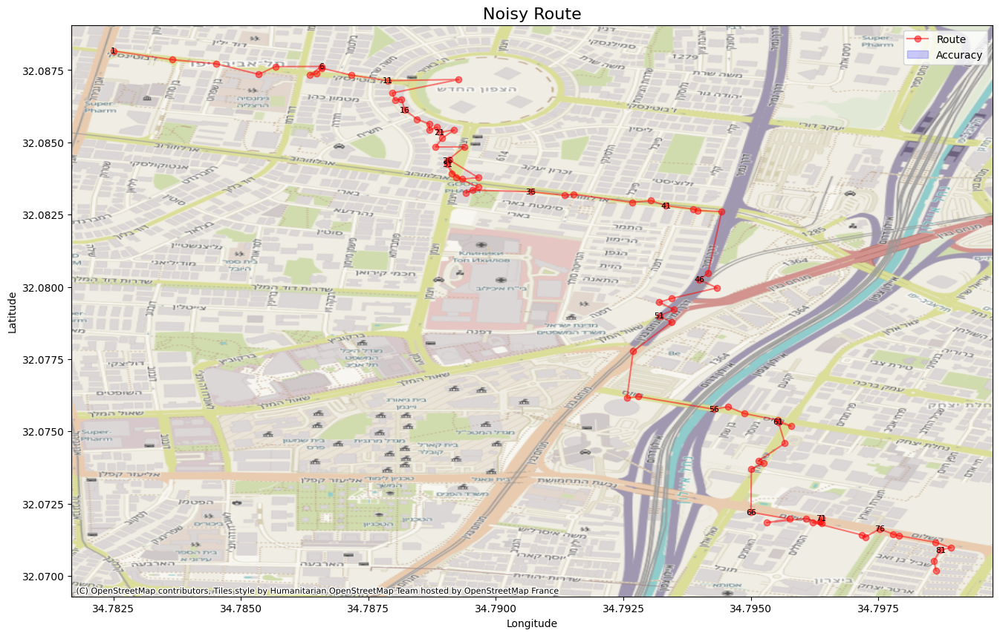

In [7]:
draw_route('Noisy Route', noisy_lons, noisy_lats, None)

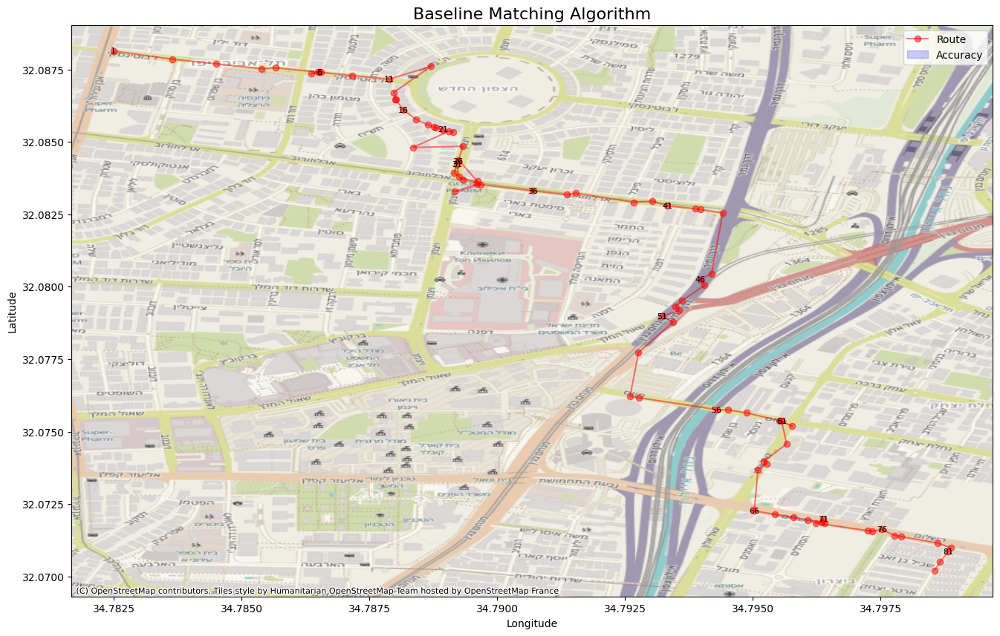

In [8]:
algo_name = algorithms[0].get_name()
draw_route(algo_name, pred_lons[algo_name], pred_lats[algo_name], None)

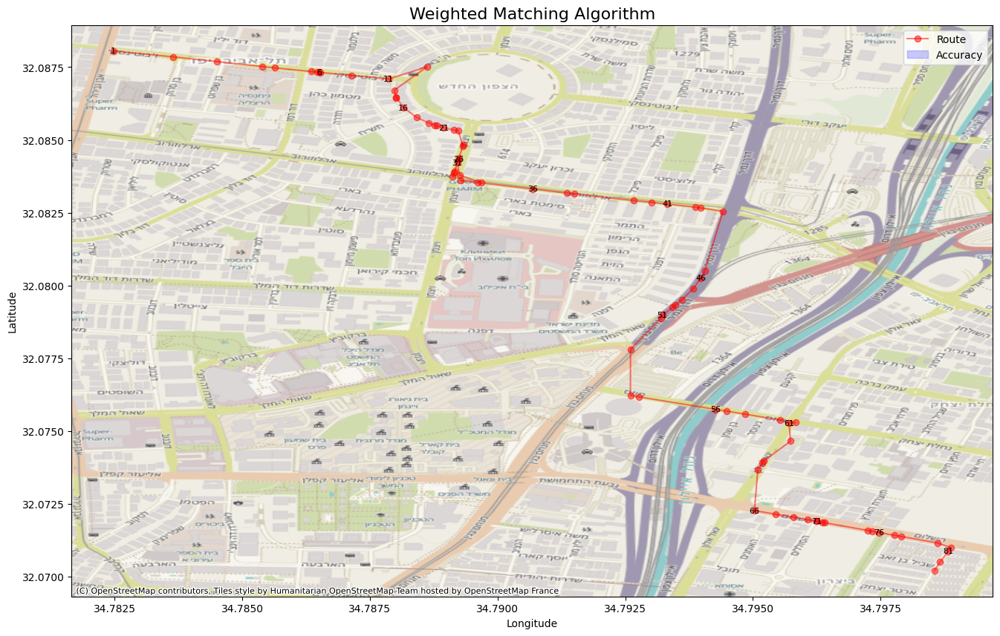

In [9]:
algo_name = algorithms[1].get_name()
draw_route(algo_name, pred_lons[algo_name], pred_lats[algo_name], None)

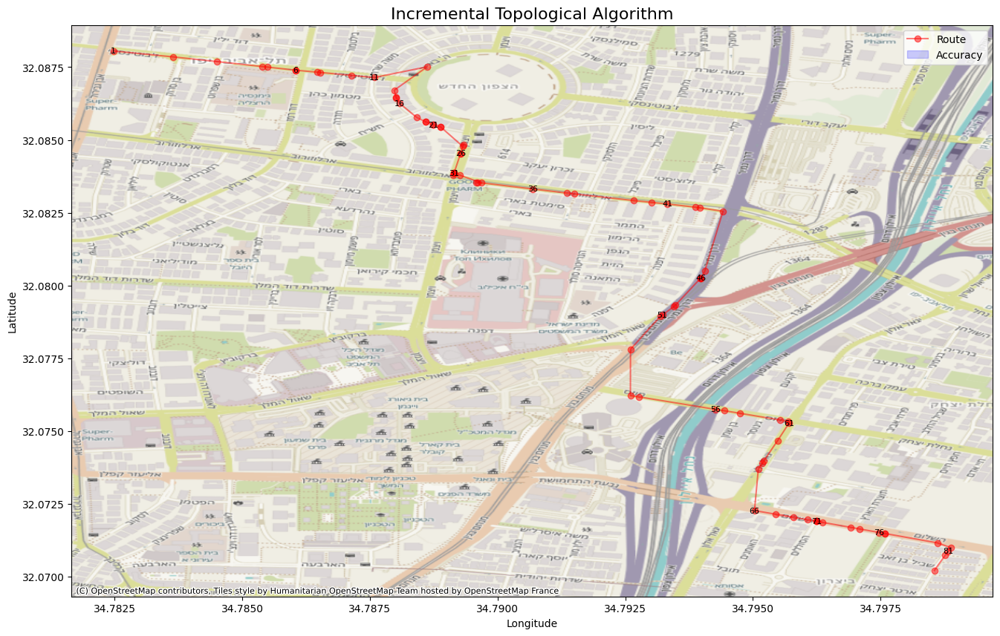

In [10]:
algo_name = algorithms[2].get_name()
draw_route(algo_name, pred_lons[algo_name], pred_lats[algo_name], None)

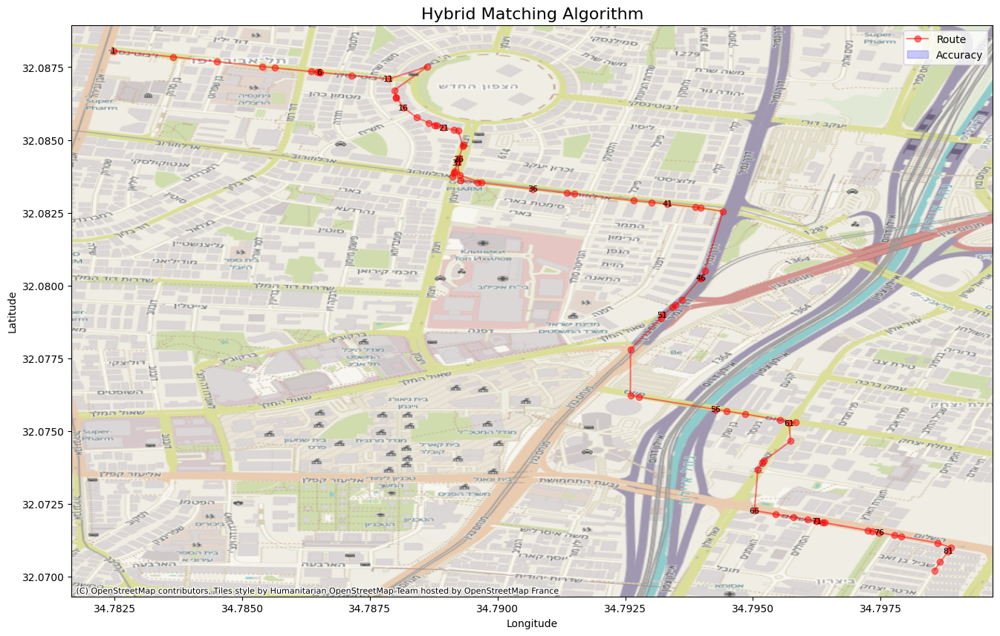

In [11]:
algo_name = algorithms[3].get_name()
draw_route(algo_name, pred_lons[algo_name], pred_lats[algo_name], None)